In [1]:
import csv
import pandas as pd
import numpy as np

df = pd.read_csv('Train_set.csv')
df = df[['Pain', 'Fatigue', 'ShortBreath',
       'Weakness', 'Nausea', 'Vomiting', 'SleepProblems', 'DaySleepy',
       'Anxiety', 'Depression', 'ProblemRemember', 'ProblemConcentrate',
       'LackAppetite', 'WeightLoss', 'WeightGain', 'ChangeUrination',
       'Diarrhea', 'Numbness', 'HotFlashes', 'NightSweats']]

We have 615 patients. The patients reported 20 symptoms using the M.D. Anderson Symptom Inventory [19] 
which measures symptom severity ranging from zero (not present) to ten (worst imaginable), with symptom management 
advice given to patients whose symptom severity was greater or equal to four on any given symptom. 


In [2]:
for col in df.columns:
    df.loc[df[col]<4,col] = 0
    df.loc[df[col]>=4,col] = 1
df

,Pain,Fatigue,ShortBreath,Weakness,Nausea,Vomiting,SleepProblems,DaySleepy,Anxiety,Depression,ProblemRemember,ProblemConcentrate,LackAppetite,WeightLoss,WeightGain,ChangeUrination,Diarrhea,Numbness,HotFlashes,NightSweats
0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
611,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
612,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
613,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0


Get rid of patients without symptoms

In [3]:
df = df.loc[(df!=0).any(axis=1)]
df = df.reset_index()
df = df.drop(columns='index')
df

,Pain,Fatigue,ShortBreath,Weakness,Nausea,Vomiting,SleepProblems,DaySleepy,Anxiety,Depression,ProblemRemember,ProblemConcentrate,LackAppetite,WeightLoss,WeightGain,ChangeUrination,Diarrhea,Numbness,HotFlashes,NightSweats
0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
4,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
572,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
573,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
574,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
575,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0


Now this becomes a binary clustering problem

# Patient-symptom bipartite network

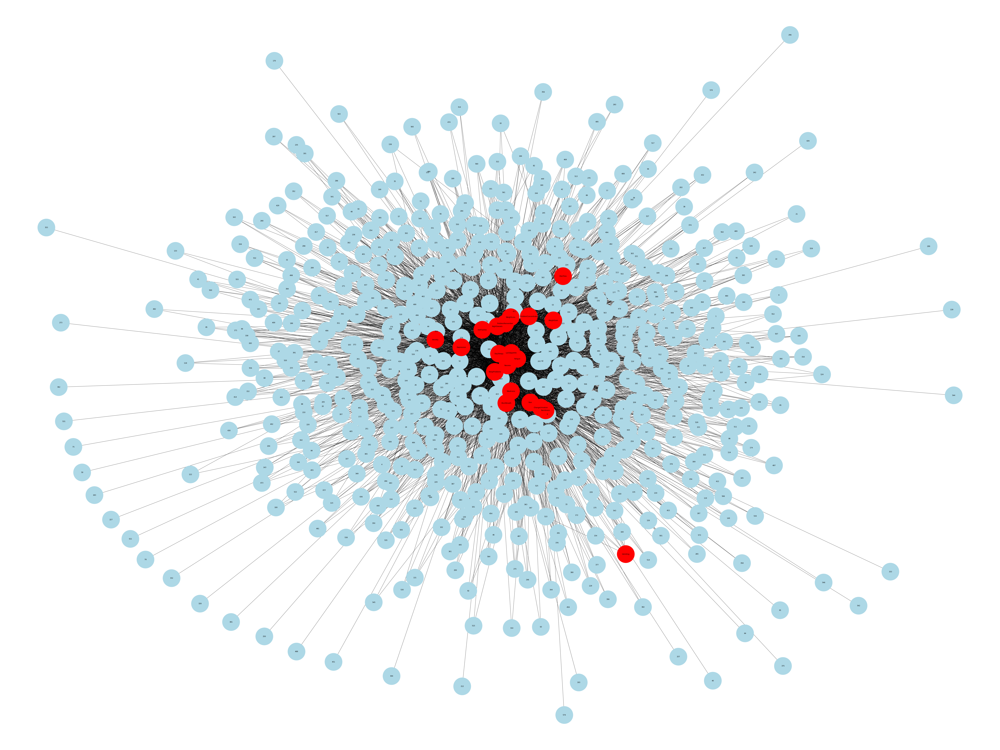

In [4]:
from networkx.algorithms import bipartite
import networkx as nx
import matplotlib.pyplot as plt

B = nx.Graph(random_state=42)
B.add_nodes_from(df.index, bipartite=0)
B.add_nodes_from(df.columns, bipartite=1)

s = df.stack()
B.add_edges_from(s[s==1.0].index)

color = bipartite.color(B)
color_dict = {0:'lightblue',1:'r'}
color_list = [color_dict[i[1]] for i in B.nodes.data('bipartite')]

plt.rcParams["figure.figsize"] = (100,75)
nx.draw(B, node_color=color_list, node_size=16000, label_size = 60000, with_labels=True)

A sample patient-symptom bipartite network above showing patients as light blue nodes, and symptoms as red nodes. 

# bipartite network one mode projection

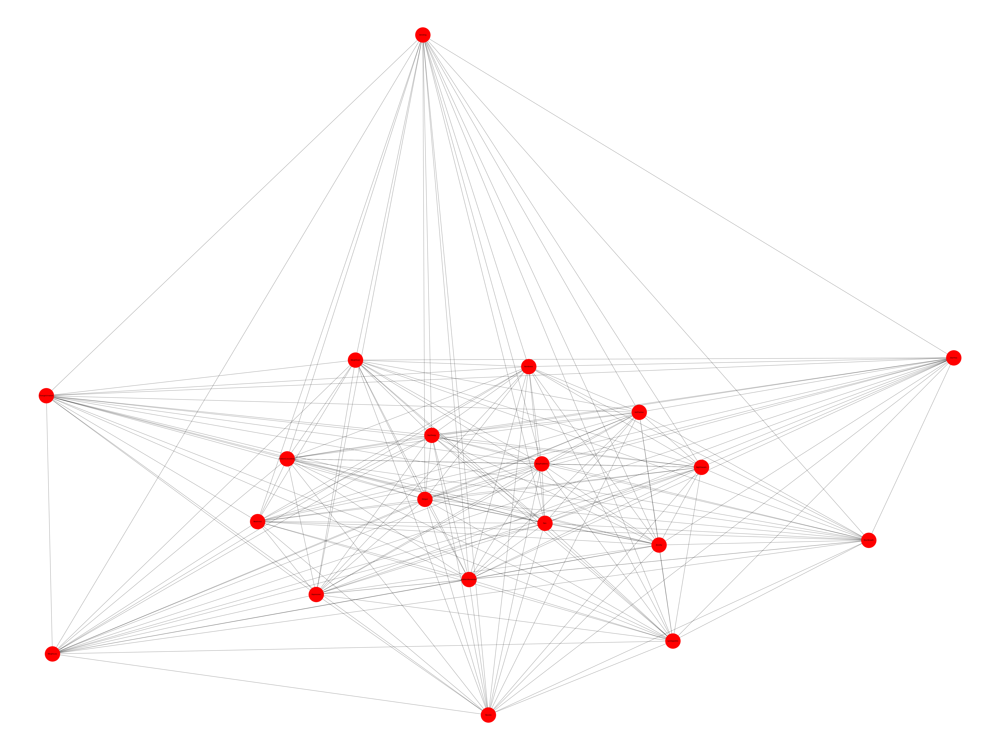

In [64]:
patients = set(n for n,d in B.nodes(data=True) if d['bipartite']==0)
symptoms = set(B) - patients
G = bipartite.weighted_projected_graph(B,symptoms,ratio=True)
pos = nx.spring_layout(G)
edge_weights = {(u,v,):d['weight'] for u,v,d in G.edges(data=True)}
nx.draw(G, node_color='r', pos = pos, node_size=12000, edge_labels=edge_weights, with_labels=True)
#nx.draw_networkx_edge_labels(G,pos,node_size=10000,edge_labels=edge_weights)
plt.rcParams["figure.figsize"] = (25,15)
#nx.draw(G, node_color='r', node_size=8000, with_labels=True)

# hierarchical clustering

Index(['Pain', 'Fatigue', 'ShortBreath', 'Weakness', 'Nausea', 'Vomiting',
       'SleepProblems', 'DaySleepy', 'Anxiety', 'Depression',
       'ProblemRemember', 'ProblemConcentrate', 'LackAppetite', 'WeightLoss',
       'WeightGain', 'ChangeUrination', 'Diarrhea', 'Numbness', 'HotFlashes',
       'NightSweats'],
      dtype='object')

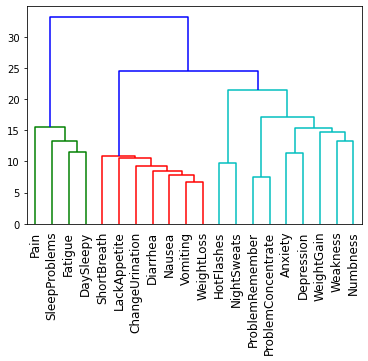

In [12]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

df_t = df.T

# explicit interface
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
dend = sch.dendrogram(sch.linkage(df_t, method='ward'), leaf_rotation=90, labels = df_t.index)
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='y', which='major')
df_t.index

In [13]:
df_t.index

Index(['Pain', 'Fatigue', 'ShortBreath', 'Weakness', 'Nausea', 'Vomiting',
       'SleepProblems', 'DaySleepy', 'Anxiety', 'Depression',
       'ProblemRemember', 'ProblemConcentrate', 'LackAppetite', 'WeightLoss',
       'WeightGain', 'ChangeUrination', 'Diarrhea', 'Numbness', 'HotFlashes',
       'NightSweats'],
      dtype='object')

In [14]:
from sklearn.cluster import AgglomerativeClustering
import numpy as np

Hclustering = AgglomerativeClustering(n_clusters=3,
 affinity='euclidean', linkage='ward')
Hclustering.fit_predict(df_t)

array([1, 1, 2, 0, 2, 2, 1, 1, 0, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0])

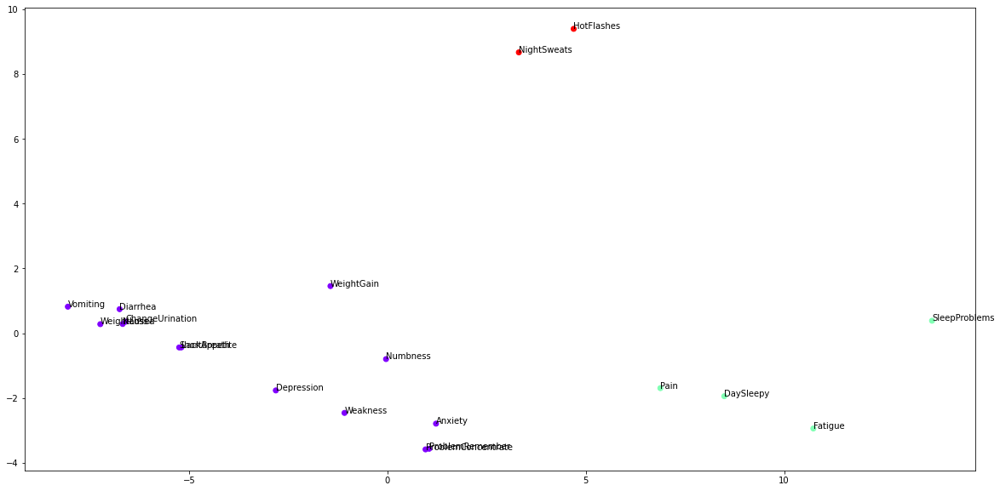

In [9]:
from sklearn.decomposition import PCA 
pca = PCA(n_components = 2) 
X_principal = pca.fit_transform(df_t) 
X_principal = pd.DataFrame(X_principal).set_index(df_t.index)
x = X_principal.loc[:,0]
y = X_principal.loc[:,1]
labels = X_principal.index
color = Hclustering.fit_predict(X_principal)

plt.figure(figsize =(20, 10))
plt.scatter(x,y, c = color,cmap = 'rainbow')
for i in range(0,20):
    plt.annotate(labels[i],(x[i],y[i]))
plt.show() 

Compress 20 syms into clusters used in prediction

Paper used hierarchical clustering with the Jaccard dissimilarity measure and Ward2 linkage criteria [10]. 
The Jaccard dissimilarity measure between two symptoms is one minus the ratio of the number of patients 
experiencing both symptoms to the number of patients experiencing either symptom [33]. 

In [10]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.datasets.samples_generator import make_blobs
from sklearn.cluster import KMeans

/Users/fanyangxin/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.datasets.samples_generator module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.datasets. Anything that cannot be imported from sklearn.datasets is now part of the private API.
  warnings.warn(message, FutureWarning)


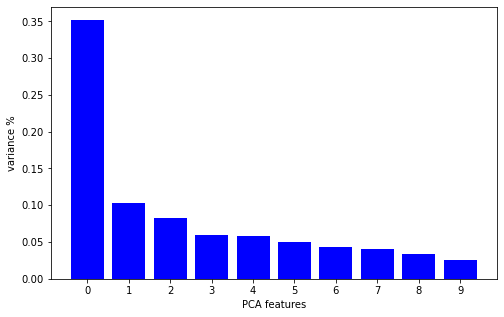

In [31]:
# Create a PCA instance: pca
pca = PCA(n_components=10)
principalComponents = pca.fit_transform(df_t)
# Plot the explained variances
features = range(pca.n_components_)
plt.figure(figsize =(8, 5))
plt.bar(features, pca.explained_variance_ratio_, color='blue')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
# Save components to a DataFrame
PCA_components = pd.DataFrame(principalComponents)

Text(0, 0.5, 'PCA 2')

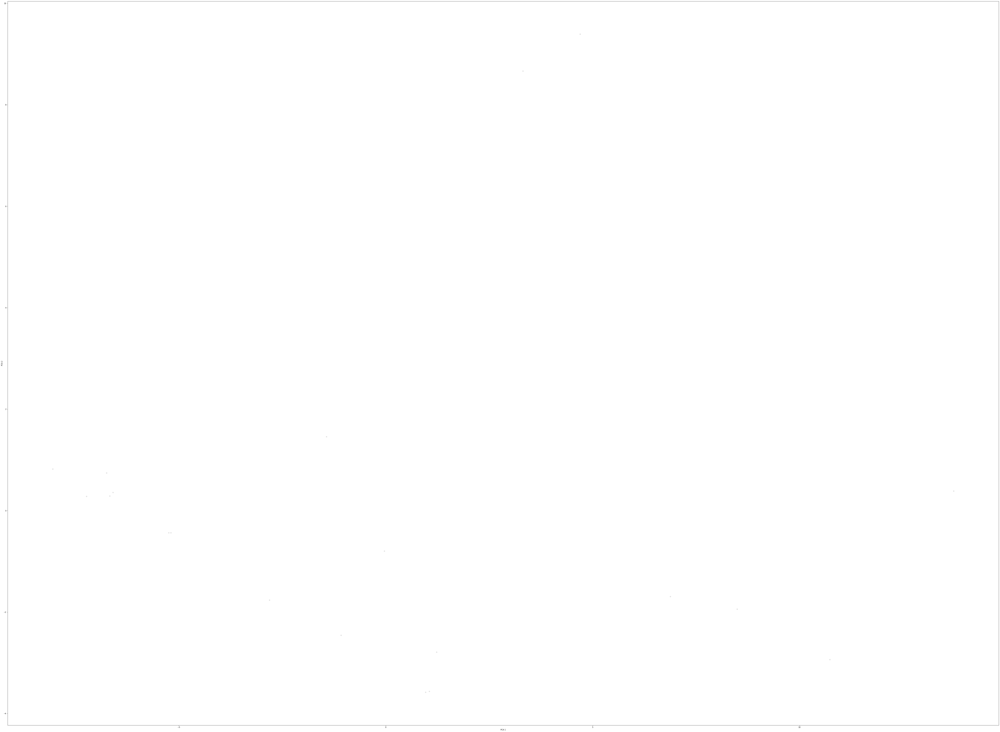

In [12]:
plt.scatter(PCA_components[0], PCA_components[1], alpha=.1, color='black')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')

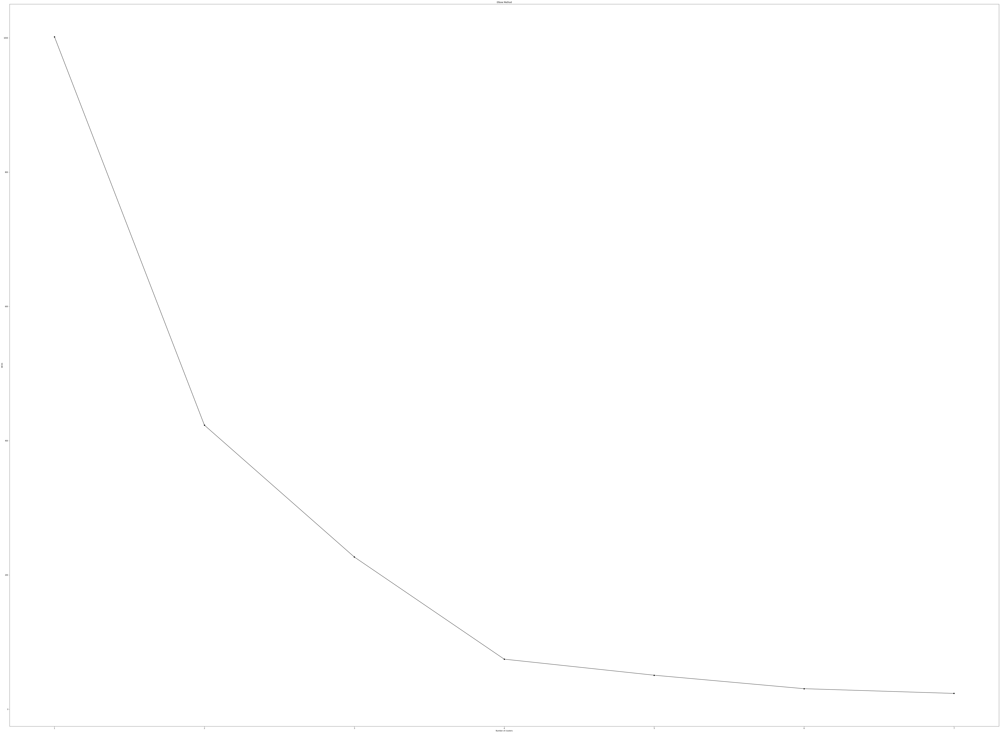

In [13]:
ks = range(1, 8)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(PCA_components.iloc[:,:2])
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='black')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.xticks(ks)
plt.show()

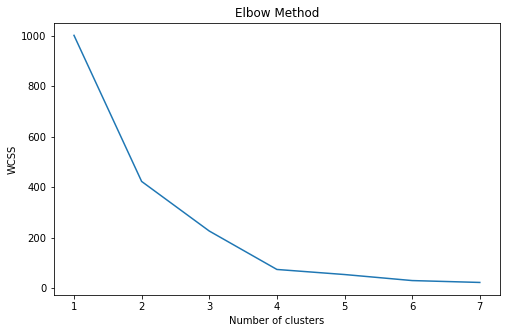

In [20]:
wcss = []
for i in range(1, 8):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(X_principal)
    wcss.append(kmeans.inertia_)
    
plt.figure(figsize =(8, 5))
x = np.arange(1, 8, 1)
plt.plot(x, wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

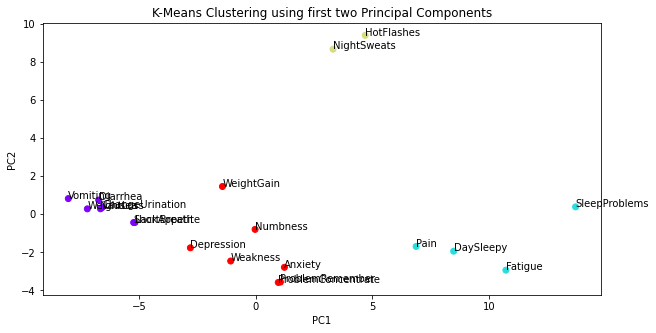

In [25]:
model = KMeans(n_clusters=4)

from sklearn.decomposition import PCA 
pca = PCA(n_components = 2) 
X_principal = pca.fit_transform(df_t) 
X_principal = pd.DataFrame(X_principal).set_index(df_t.index)
x = X_principal.loc[:,0]
y = X_principal.loc[:,1]

model.fit(PCA_components.iloc[:,:2])
labels = X_principal.index

color = model.predict(PCA_components.iloc[:,:2])

plt.figure(figsize =(10, 5))
plt.scatter(x,y, c = color,cmap = 'rainbow')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('K-Means Clustering using first two Principal Components')
for i in range(0,20):
    plt.annotate(labels[i],(x[i],y[i]))
plt.show() 